# **Butterfly Classification** 🦋

## Importing Library

In [1]:
import numpy as np, pandas as pd
from PIL import Image
import os
import matplotlib.pyplot as plt
import re
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf

2025-10-02 12:50:13.458635: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1759409413.699335      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1759409413.765747      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Importing Csv

In [2]:
df = pd.read_csv("/kaggle/input/butterfly-image-classification/Training_set.csv")
df

,filename,label
0,Image_1.jpg,SOUTHERN DOGFACE
1,Image_2.jpg,ADONIS
2,Image_3.jpg,BROWN SIPROETA
3,Image_4.jpg,MONARCH
4,Image_5.jpg,GREEN CELLED CATTLEHEART
...,...,...
6494,Image_6495.jpg,MANGROVE SKIPPER
6495,Image_6496.jpg,MOURNING CLOAK
6496,Image_6497.jpg,APPOLLO
6497,Image_6498.jpg,ELBOWED PIERROT


## Importing Images

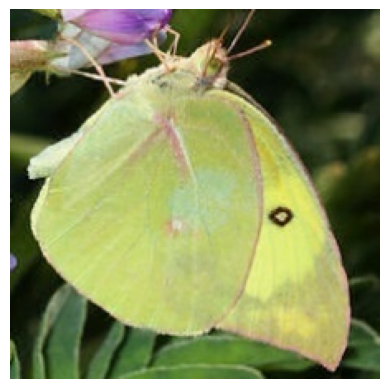

In [3]:
folder_path = "/kaggle/input/butterfly-image-classification/train"
files = os.listdir(folder_path)

def extract_number(f):
    return int(re.search(r'\d+', f).group())

def load_files(folder_path, files):
    data = [] 
    file_name = []
    for i in range(len(files)):
        img = Image.open(os.path.join(folder_path, files[i]))
        data.append(np.array(img))
        file_name.append(files[i])
        df = pd.DataFrame({
            "filename": file_name,
            "data": data
        })
        df = df.sort_values(by="filename",key=lambda x: x.map(extract_number)).reset_index(drop=True)
    return np.array(df["data"])
X = load_files(folder_path,files)
plt.imshow(X[0])
plt.axis("off")
plt.show()

## How is the data

In [4]:
X[0]

array([[[ 25,  43,  31],
        [ 25,  43,  31],
        [ 26,  42,  29],
        ...,
        [ 35,  47,  23],
        [ 40,  53,  27],
        [ 46,  59,  33]],

       [[ 26,  44,  32],
        [ 25,  43,  29],
        [ 26,  42,  29],
        ...,
        [ 46,  59,  33],
        [ 53,  63,  38],
        [ 56,  69,  41]],

       [[ 24,  45,  30],
        [ 24,  45,  28],
        [ 25,  43,  27],
        ...,
        [ 59,  69,  42],
        [ 63,  72,  43],
        [ 67,  78,  48]],

       ...,

       [[ 61,  97,  61],
        [ 67, 103,  65],
        [ 68, 107,  63],
        ...,
        [ 41,  63,  24],
        [ 43,  66,  22],
        [ 44,  67,  21]],

       [[ 64,  98,  63],
        [ 71, 107,  69],
        [ 71, 110,  66],
        ...,
        [ 41,  64,  20],
        [ 43,  66,  20],
        [ 42,  68,  20]],

       [[ 70, 104,  69],
        [ 73, 109,  71],
        [ 74, 111,  68],
        ...,
        [ 42,  65,  19],
        [ 42,  68,  21],
        [ 43,  69,  21]]

In [5]:
X.shape

(6499,)

## Label Encoding

In [6]:
encoder = LabelEncoder()
df["encoded_label"] = encoder.fit_transform(df['label'])
df

,filename,label,encoded_label
0,Image_1.jpg,SOUTHERN DOGFACE,66
1,Image_2.jpg,ADONIS,0
2,Image_3.jpg,BROWN SIPROETA,12
3,Image_4.jpg,MONARCH,44
4,Image_5.jpg,GREEN CELLED CATTLEHEART,33
...,...,...,...
6494,Image_6495.jpg,MANGROVE SKIPPER,40
6495,Image_6496.jpg,MOURNING CLOAK,45
6496,Image_6497.jpg,APPOLLO,4
6497,Image_6498.jpg,ELBOWED PIERROT,29


## Scaling

In [7]:
X = X/255

In [8]:
X[0]

array([[[0.09803922, 0.16862745, 0.12156863],
        [0.09803922, 0.16862745, 0.12156863],
        [0.10196078, 0.16470588, 0.11372549],
        ...,
        [0.1372549 , 0.18431373, 0.09019608],
        [0.15686275, 0.20784314, 0.10588235],
        [0.18039216, 0.23137255, 0.12941176]],

       [[0.10196078, 0.17254902, 0.1254902 ],
        [0.09803922, 0.16862745, 0.11372549],
        [0.10196078, 0.16470588, 0.11372549],
        ...,
        [0.18039216, 0.23137255, 0.12941176],
        [0.20784314, 0.24705882, 0.14901961],
        [0.21960784, 0.27058824, 0.16078431]],

       [[0.09411765, 0.17647059, 0.11764706],
        [0.09411765, 0.17647059, 0.10980392],
        [0.09803922, 0.16862745, 0.10588235],
        ...,
        [0.23137255, 0.27058824, 0.16470588],
        [0.24705882, 0.28235294, 0.16862745],
        [0.2627451 , 0.30588235, 0.18823529]],

       ...,

       [[0.23921569, 0.38039216, 0.23921569],
        [0.2627451 , 0.40392157, 0.25490196],
        [0.26666667, 0

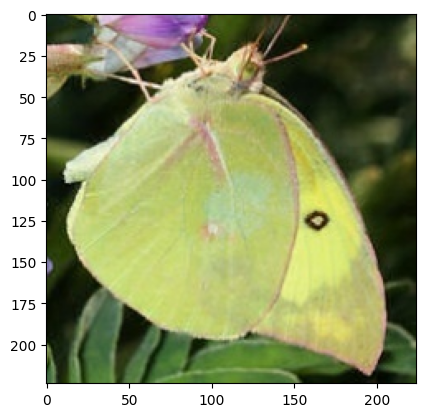

In [9]:
plt.imshow(X[0])

## All Classes

In [10]:
print(encoder.classes_.shape[0], "Classes: ")
for i, x in enumerate(encoder.classes_):
    if i%4==0:
        print()
    print(i, ":\t", x, end=" "*((30-len(x))))

75 Classes: 

0 :	 ADONIS                        1 :	 AFRICAN GIANT SWALLOWTAIL     2 :	 AMERICAN SNOOT                3 :	 AN 88                         
4 :	 APPOLLO                       5 :	 ATALA                         6 :	 BANDED ORANGE HELICONIAN      7 :	 BANDED PEACOCK                
8 :	 BECKERS WHITE                 9 :	 BLACK HAIRSTREAK              10 :	 BLUE MORPHO                   11 :	 BLUE SPOTTED CROW             
12 :	 BROWN SIPROETA                13 :	 CABBAGE WHITE                 14 :	 CAIRNS BIRDWING               15 :	 CHECQUERED SKIPPER            
16 :	 CHESTNUT                      17 :	 CLEOPATRA                     18 :	 CLODIUS PARNASSIAN            19 :	 CLOUDED SULPHUR               
20 :	 COMMON BANDED AWL             21 :	 COMMON WOOD-NYMPH             22 :	 COPPER TAIL                   23 :	 CRECENT                       
24 :	 CRIMSON PATCH                 25 :	 DANAID EGGFLY                 26 :	 EASTERN COMA                  27 :	 EASTERN DAPP

## Has every classes and images loaded perfectly

ADONIS
1 78 279 329 347 451 

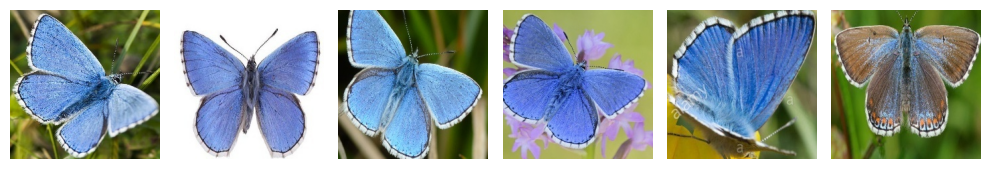

AFRICAN GIANT SWALLOWTAIL
289 373 427 437 465 503 

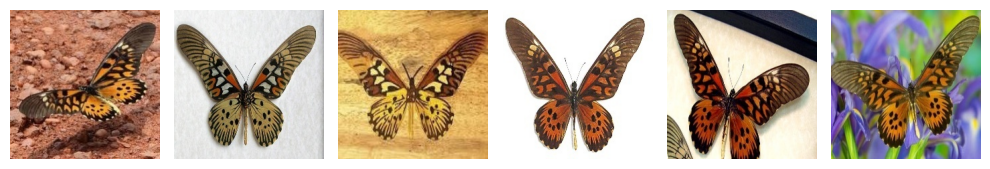

AMERICAN SNOOT
116 238 307 334 386 467 

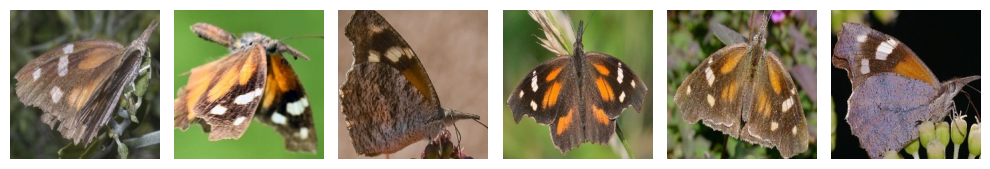

AN 88
122 320 342 464 534 782 

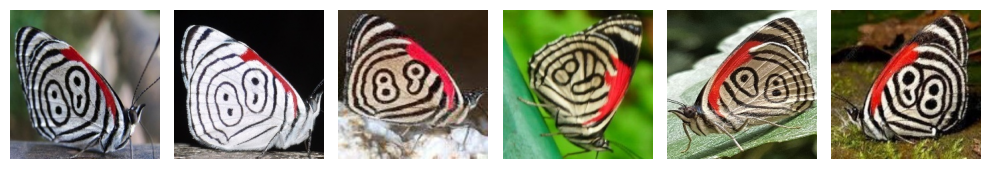

APPOLLO
65 85 303 324 416 472 

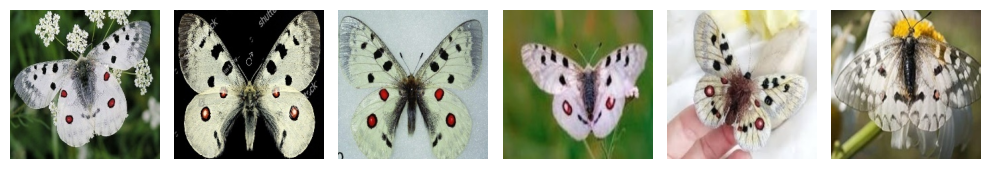

ATALA
29 71 103 252 258 294 

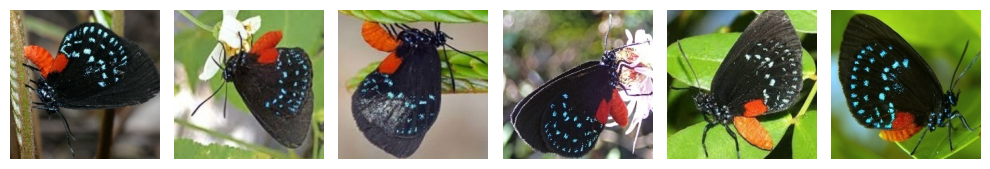

In [11]:
for k in range(6):
    print(encoder.classes_[k])
    plt.figure(figsize=(10, 100))
    j=0
    for i in df.index[df["encoded_label"]==k][:6].to_list():
        print(i, end=" ")
        ax = plt.subplot(20, 6, j + 1)
        j+=1
        plt.axis("off")
        plt.imshow(X[i])
    plt.tight_layout()
    plt.show()

## Every Classes Butterflies

1 289 116 122 65 29 285 47 100 11 23 39 2 12 5 20 300 232 304 24 127 22 55 128 46 34 186 7 170 143 95 151 56 4 256 60 30 21 36 63 10 168 137 106 3 73 26 91 154 14 16 19 18 38 89 141 27 45 13 44 9 101 52 108 140 17 0 25 80 68 124 62 157 203 156 

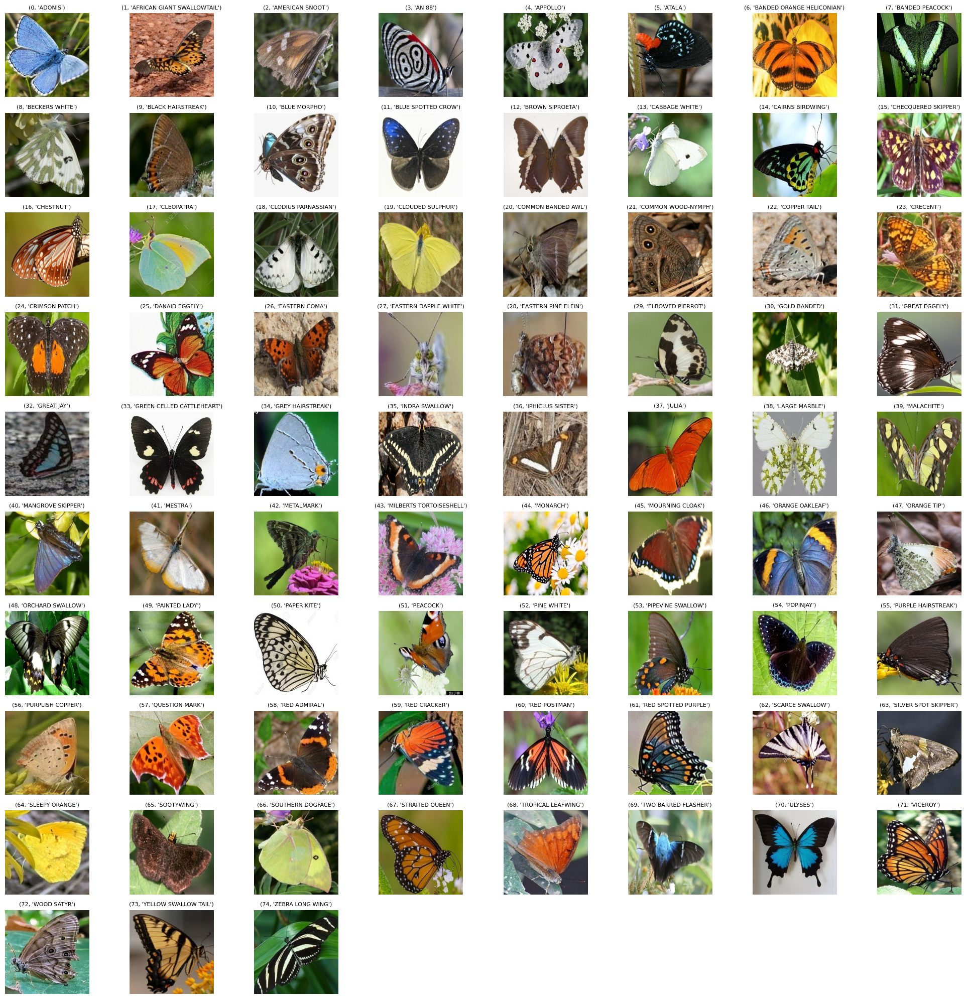

In [12]:
plt.figure(figsize=(20, 20))
for i in range(75):
    j = df.index[df["encoded_label"]==i][0]
    print(j, end=" ")
    ax = plt.subplot(10, 8, i+1)
    ax.set_title((i,encoder.classes_[i]), fontsize=8)
    plt.axis("off")
    plt.imshow(X[j])
plt.tight_layout()
plt.show()

## Split

In [13]:
from sklearn.model_selection import train_test_split
Y = np.array(df["encoded_label"], dtype="float32")
X = np.array(X.tolist(), dtype="float32")
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.2, random_state=42, stratify=Y
)
X_val, X_test, y_val, y_test = train_test_split(
    X_test, y_test, test_size=0.5, random_state=42, stratify=y_test
)
type(y_train)

numpy.ndarray

## Resize if need

In [14]:
# X_train = tf.image.resize(X_train, [128, 128]).numpy()
# X_val   = tf.image.resize(X_val,   [128, 128]).numpy()
# X_test  = tf.image.resize(X_test,  [128, 128]).numpy()
# plt.imshow(X_train[0])

## Augmentation, Early stopping, Reducing Lr

In [15]:
from tensorflow.keras import layers
from tensorflow.keras.callbacks import ReduceLROnPlateau

data_augmentation = tf.keras.Sequential(
  [
    layers.RandomFlip("horizontal", input_shape=(224, 224, 3)),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.5),
    layers.RandomTranslation(height_factor=0.05,width_factor=0.05)
  ]
)
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=40,
    restore_best_weights=True
)
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.5,   # yarıya indir
                              patience=5,   # 3 epoch boyunca iyileşme yoksa
                              min_lr=1e-6)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
I0000 00:00:1759409523.640771      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


## Mobile Net

In [16]:
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = False  # freeze base

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


## Training

In [17]:
model = tf.keras.Sequential([
    data_augmentation,
    base_model,
    tf.keras.layers.Conv2D(32, (3,3), activation="relu", padding = 'same'),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Conv2D(64, (3,3), activation="relu", padding = 'same'),
    tf.keras.layers.MaxPooling2D((2,2)),
    # tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1000, activation="relu"),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(1000, activation="relu"),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(75, activation="softmax")
])

In [18]:
model.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy"])

In [19]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 7, 7, 32)       │       368,672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 3, 3, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 3, 3, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 1, 1, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1000)           │        65,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1000)           │     1,001,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 75)             │        75,075 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,786,227 (14.44 MB)

 Trainable params: 1,528,243 (5.83 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [20]:
model.fit(X_train,y_train,epochs = 400, validation_data=(X_val, y_val), callbacks=[early_stopping, reduce_lr])

Epoch 1/400


I0000 00:00:1759409549.141745      62 cuda_dnn.cc:529] Loaded cuDNN version 90300


163/163 ━━━━━━━━━━━━━━━━━━━━ 27s 89ms/step - accuracy: 0.0547 - loss: 4.0595 - val_accuracy: 0.1569 - val_loss: 3.1942 - learning_rate: 0.0010
Epoch 2/400
163/163 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - accuracy: 0.2587 - loss: 2.6249 - val_accuracy: 0.4000 - val_loss: 2.1080 - learning_rate: 0.0010
Epoch 3/400
163/163 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.4392 - loss: 1.9097 - val_accuracy: 0.4662 - val_loss: 1.7517 - learning_rate: 0.0010
Epoch 4/400
163/163 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5409 - loss: 1.5355 - val_accuracy: 0.5446 - val_loss: 1.5164 - learning_rate: 0.0010
Epoch 5/400
163/163 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - accuracy: 0.5924 - loss: 1.3201 - val_accuracy: 0.5600 - val_loss: 1.4039 - learning_rate: 0.0010
Epoch 6/400
163/163 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step - accuracy: 0.6113 - loss: 1.2691 - val_accuracy: 0.5831 - val_loss: 1.3319 - learning_rate: 0.0010
Epoch 7/400
163/163 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - accuracy: 0.6394 - loss: 

## Testing

In [21]:
from tensorflow.keras.preprocessing import image
img_array = image.img_to_array(X[0]) / 255.0  # normalize (0-1)
img_array = np.expand_dims(img_array, axis=0)  # shape: (1, 224, 224, 3)

# Make prediction
pred = model.predict(img_array)
pred_class = np.argmax(pred, axis=1)  # get class index
pred_class

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


array([10])

In [22]:
model.evaluate(X_test, y_test)

21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.7642 - loss: 0.8098


[0.7701901197433472, 0.7753846049308777]

In [23]:
model.save('butterfly.h5')

In [24]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
conf_matrix = confusion_matrix(y_test, y_pred)
for x, i in enumerate(conf_matrix):
    print(x, "\t", end=" ")
    for j in i:
        print(j, end=" ")
    print()

21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step
0 	 8 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
1 	 0 8 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2 	 0 0 6 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 
3 	 0 0 0 7 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
4 	 0 0 0 0 7 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
5 	 0 0 0 0 0 8 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
6 	 0 0 1 0 0 0 5 0 0 0 0 0 0 

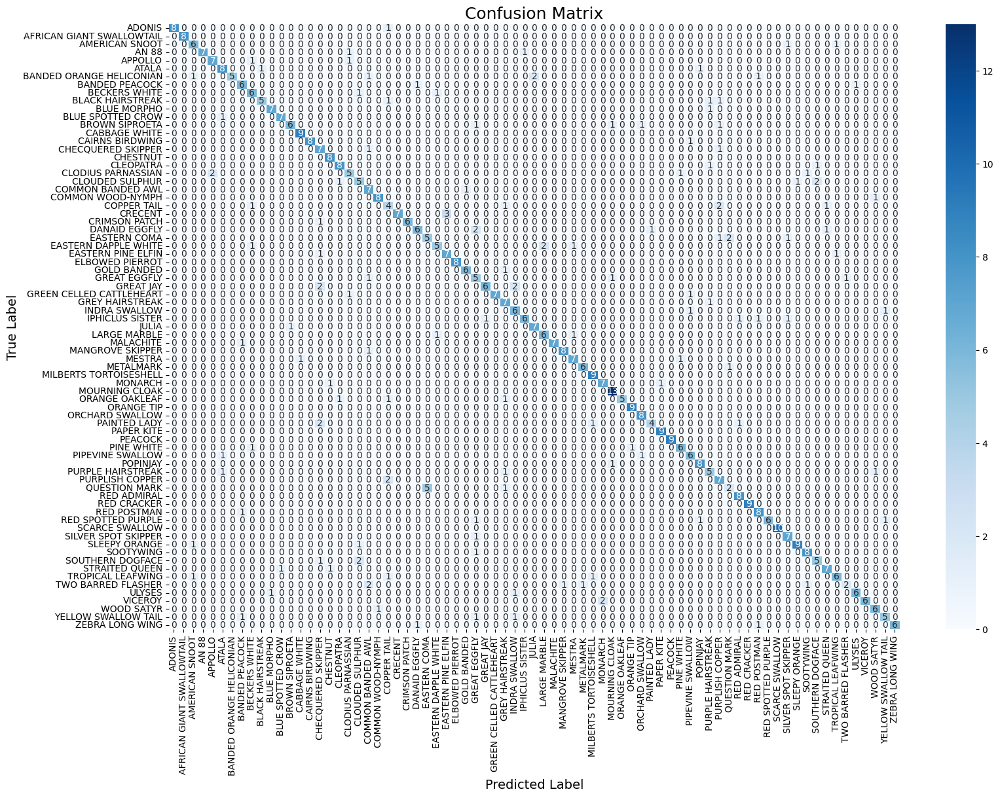

In [25]:
plt.figure(figsize=(18,12))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=encoder.classes_, 
            yticklabels=encoder.classes_)

plt.title("Confusion Matrix", fontsize=18)
plt.ylabel("True Label", fontsize=14)
plt.xlabel("Predicted Label", fontsize=14)
plt.show()

In [26]:
# total samples per class
class_totals = conf_matrix.sum(axis=1)

# correct predictions (diagonal of confusion matrix)
correct_preds = np.diag(conf_matrix)

# error count per class
errors = class_totals - correct_preds

# error percentage
error_percentage = (errors / class_totals) * 100
accuracy_percentage = (correct_preds / class_totals) * 100

# make DataFrame
df_metrics = pd.DataFrame({
    "Class": encoder.classes_,
    "Total": class_totals,
    "Correct": correct_preds,
    "Accuracy %": accuracy_percentage.round(2),
    "Errors": errors,
    "Error %": error_percentage.round(2)
})

pd.set_option("display.max_rows", None)   # show all rows
pd.set_option("display.max_columns", None) # show all columns
pd.set_option("display.width", None)       # don't wrap lines
pd.set_option("display.max_colwidth", None) # show full column content
df_metrics

,Class,Total,Correct,Accuracy %,Errors,Error %
0,ADONIS,9,8,88.89,1,11.11
1,AFRICAN GIANT SWALLOWTAIL,8,8,100.00,0,0.00
2,AMERICAN SNOOT,8,6,75.00,2,25.00
3,AN 88,9,7,77.78,2,22.22
4,APPOLLO,9,7,77.78,2,22.22
5,ATALA,10,8,80.00,2,20.00
6,BANDED ORANGE HELICONIAN,10,5,50.00,5,50.00
7,BANDED PEACOCK,8,6,75.00,2,25.00
8,BECKERS WHITE,8,6,75.00,2,25.00
9,BLACK HAIRSTREAK,8,5,62.50,3,37.50


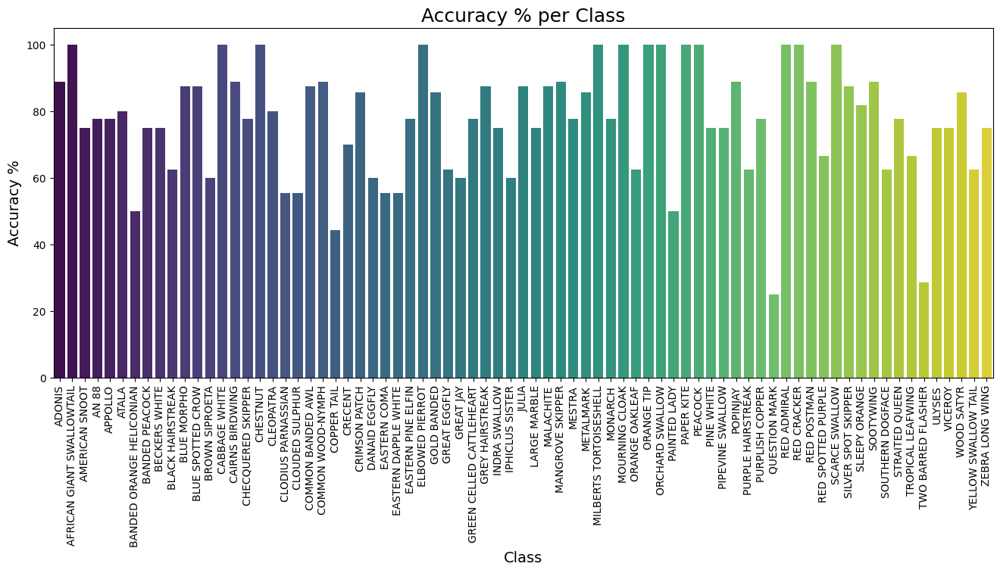

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16,6))  # make it BIG
sns.barplot(x="Class", y="Accuracy %", data=df_metrics, palette="viridis")

plt.xticks(rotation=90)  # rotate labels if many classes
plt.title("Accuracy % per Class", fontsize=18)
plt.ylabel("Accuracy %", fontsize=14)
plt.xlabel("Class", fontsize=14)
plt.show()

## Criminal Butterflies

Wanted Classes:
19 classes that have less 65% accuracy:


----------------------------------------------------------------------------
BANDED ORANGE HELICONIAN                                           ⭐⭐⭐
Accuracy: 50.0 %
285 374 407 442 

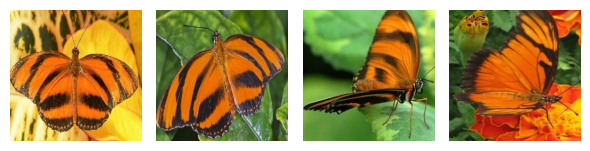



----------------------------------------------------------------------------
BLACK HAIRSTREAK                                                      ⭐⭐
Accuracy: 62.5 %
11 33 113 235 

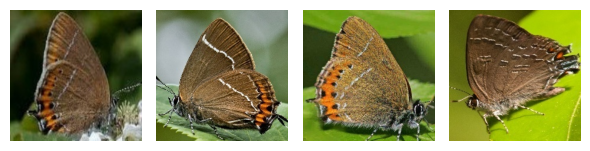



----------------------------------------------------------------------------
BROWN SIPROETA                                                        ⭐⭐
Accuracy: 60.0 %
2 8 104 110 

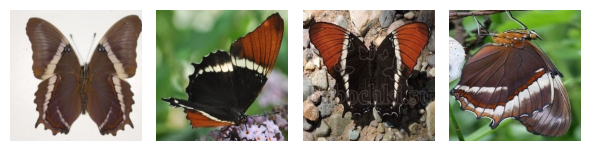



----------------------------------------------------------------------------
CLODIUS PARNASSIAN                                                    ⭐⭐
Accuracy: 55.56 %
304 338 359 392 

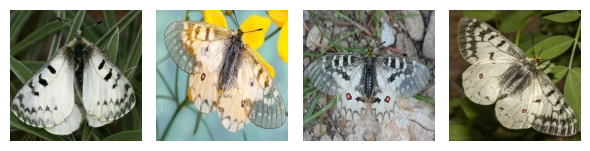



----------------------------------------------------------------------------
CLOUDED SULPHUR                                                       ⭐⭐
Accuracy: 55.56 %
24 28 93 133 

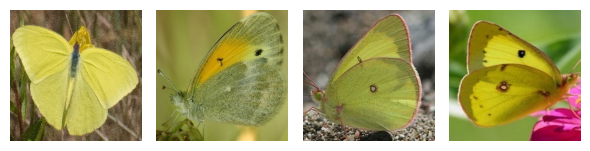



----------------------------------------------------------------------------
COPPER TAIL                                                     ⭐⭐⭐⭐
Accuracy: 44.44 %
55 99 102 226 

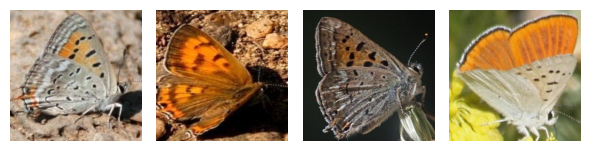



----------------------------------------------------------------------------
DANAID EGGFLY                                                         ⭐⭐
Accuracy: 60.0 %
34 37 49 53 

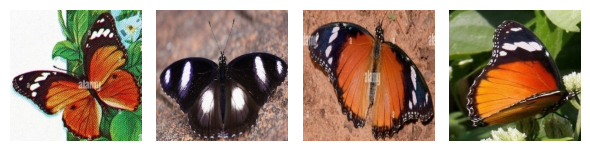



----------------------------------------------------------------------------
EASTERN COMA                                                          ⭐⭐
Accuracy: 55.56 %
186 200 301 332 

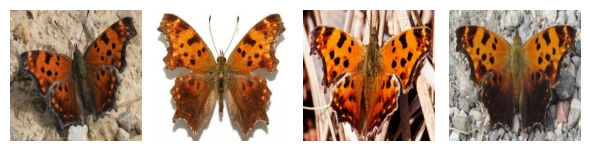



----------------------------------------------------------------------------
EASTERN DAPPLE WHITE                                                  ⭐⭐
Accuracy: 55.56 %
7 41 183 191 

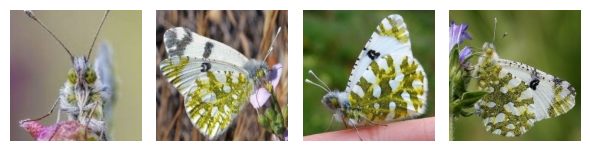



----------------------------------------------------------------------------
GREAT EGGFLY                                                          ⭐⭐
Accuracy: 62.5 %
151 225 292 330 

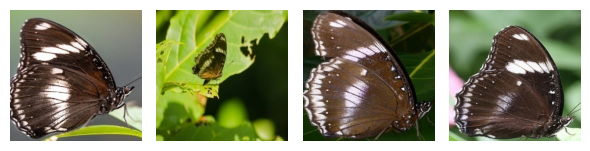



----------------------------------------------------------------------------
GREAT JAY                                                             ⭐⭐
Accuracy: 60.0 %
56 131 302 306 

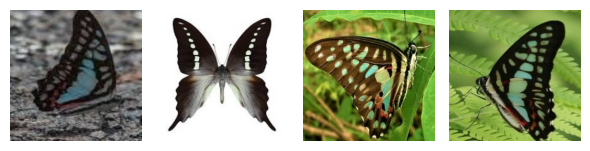



----------------------------------------------------------------------------
IPHICLUS SISTER                                                       ⭐⭐
Accuracy: 60.0 %
30 64 205 326 

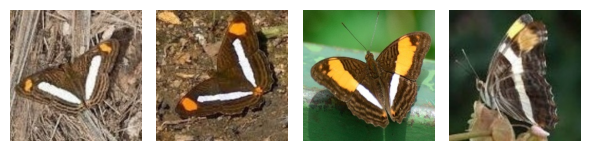



----------------------------------------------------------------------------
ORANGE OAKLEAF                                                        ⭐⭐
Accuracy: 62.5 %
26 54 57 69 

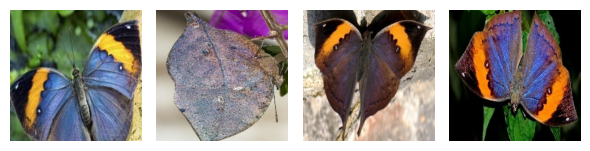



----------------------------------------------------------------------------
PAINTED LADY                                                       ⭐⭐⭐
Accuracy: 50.0 %
14 35 43 74 

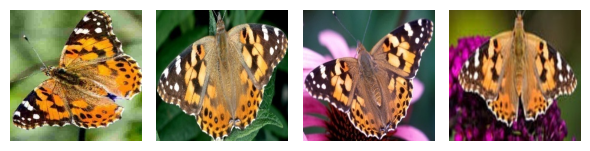



----------------------------------------------------------------------------
PURPLE HAIRSTREAK                                                     ⭐⭐
Accuracy: 62.5 %
141 254 361 418 

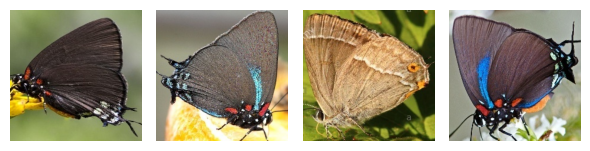



----------------------------------------------------------------------------
QUESTION MARK                                                ⭐⭐⭐⭐⭐⭐
Accuracy: 25.0 %
45 59 76 84 

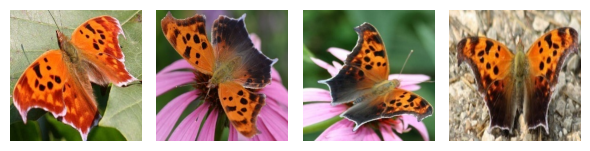



----------------------------------------------------------------------------
SOUTHERN DOGFACE                                                      ⭐⭐
Accuracy: 62.5 %
0 132 144 268 

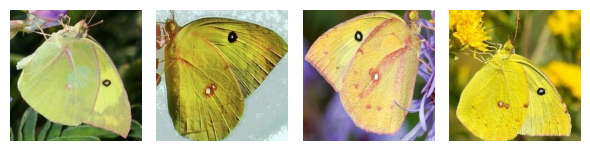



----------------------------------------------------------------------------
TWO BARRED FLASHER                                           ⭐⭐⭐⭐⭐
Accuracy: 28.57 %
68 77 369 490 

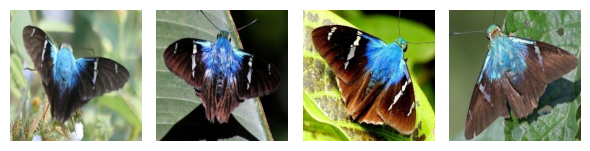



----------------------------------------------------------------------------
YELLOW SWALLOW TAIL                                                   ⭐⭐
Accuracy: 62.5 %
203 246 434 514 

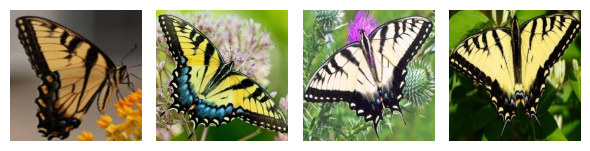

In [28]:
wanted_classes = [(i,x) for i,x in enumerate(df_metrics["Accuracy %"]) if x<65]
print("Wanted Classes:")
print(len(wanted_classes), "classes that have less 65% accuracy:")
for k,x in wanted_classes:
    print()
    print()
    print("----------------------------------------------------------------------------")
    print(encoder.classes_[k], " "*(30-len(encoder.classes_[k])+int((x+5)/10)*3+20), "⭐"*int(8-np.round(x/10)))
    print("Accuracy:", x, "%")
    plt.figure(figsize=(6, 100))
    j=0
    for i in df.index[df["encoded_label"]==k][:4].to_list():
        print(i, end=" ")
        ax = plt.subplot(20, 4, j + 1)
        j+=1
        plt.axis("off")
        plt.imshow(X[i])
    plt.tight_layout()
    plt.show()

No Talking. Just Kill This Butterflies

Thanks for visiting the notebook